In [21]:
# Import configuration constants
import sys
import importlib

sys.path.append("/Volumes/Code/Footaball-analysis")

# Reload modules to get latest changes
import src.config

importlib.reload(src.config)

# Import all configuration constants
from src.config import (
    BALL_ID,
    GOALKEEPER_ID,
    PLAYER_ID,
    REFEREE_ID,
    INPUT_VIDEO_PATH,
    OUTPUT_DIR,
    MODELS_DIR,
    PLAYER_DETECTION_MODEL_PATH,
    KEYPOINT_MODEL_PATH,
    SIGLIP_MODEL_PATH,
    PITCH_PADDING,
    PITCH_SCALE,
    PITCH_LINE_THICKNESS,
    PITCH_POINT_RADIUS,
    PLAYER_POINT_RADIUS,
    PLAYER_POINT_THICKNESS,
    PATH_THICKNESS,
    BALL_POINT_RADIUS,
    MINI_MAP_POSITION,
    MINI_MAP_SCALE,
    MINI_MAP_BORDER_THICKNESS,
)

print("✅ Configuration constants imported successfully!")
print(f"Ball ID: {BALL_ID}")
print(f"Player detection model path: {PLAYER_DETECTION_MODEL_PATH}")
print(f"Keypoint model path: {KEYPOINT_MODEL_PATH}")
print(f"Input video path: {INPUT_VIDEO_PATH}")

✅ Configuration constants imported successfully!
Ball ID: 0
Player detection model path: ../models/player-detection.pt
Keypoint model path: ../models/keypoint-detection.pt
Input video path: ../inputs/121364_0.mp4


In [24]:
# Reload all modules to get the updated code
import src.model
import src.team
import src.frame_processor
import src.mini_map
import src.soccer
import src.annotators

importlib.reload(src.model)
importlib.reload(src.team)
importlib.reload(src.frame_processor)
importlib.reload(src.mini_map)
importlib.reload(src.soccer)
importlib.reload(src.annotators)

from src.model import get_models

# Use the config constants for model paths
PLAYER_DETECTION_MODEL, KEYPOINT_MODEL = get_models(
    player_detection_model_path="/Volumes/Code/Footaball-analysis/models/player-detection.pt",
    keypoint_model_path="/Volumes/Code/Footaball-analysis/models/keypoint-detection.pt",
)

print("✅ Models loaded successfully!")
print(f"Player Detection Model: {type(PLAYER_DETECTION_MODEL)}")
print(f"Keypoint Model: {type(KEYPOINT_MODEL)}")

✅ Models loaded successfully!
Player Detection Model: <class 'ultralytics.models.yolo.model.YOLO'>
Keypoint Model: <class 'ultralytics.models.yolo.model.YOLO'>


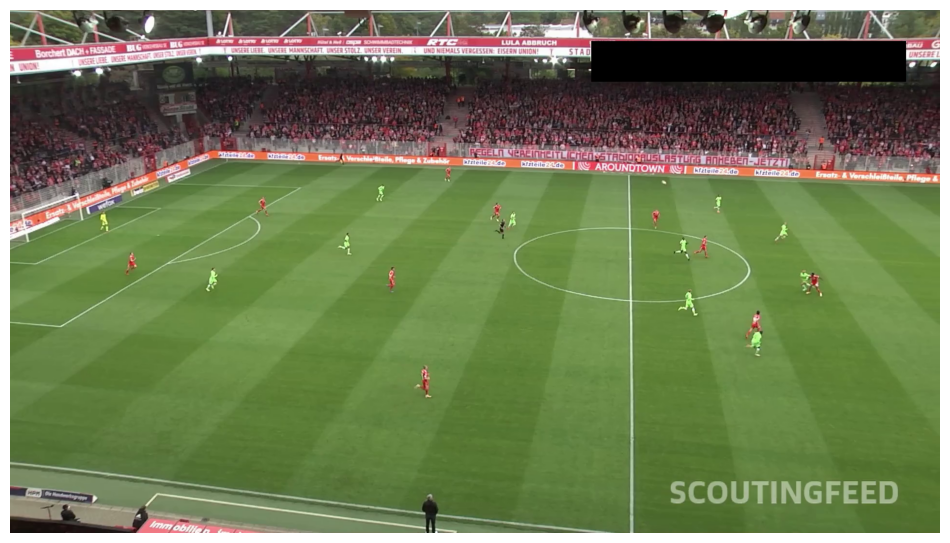

In [25]:
import supervision as sv

# Use config constant for source video path, but adjust path for notebook location
SOURCE_VIDEO_PATH = "/Volumes/Code/Footaball-analysis/inputs/121364_0.mp4"

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

sv.plot_image(frame)


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 2 referees, 4810.9ms
Speed: 37.4ms preprocess, 4810.9ms inference, 20.0ms postprocess per image at shape (1, 3, 736, 1280)
0: 736x1280 1 ball, 1 goalkeeper, 20 players, 2 referees, 4810.9ms
Speed: 37.4ms preprocess, 4810.9ms inference, 20.0ms postprocess per image at shape (1, 3, 736, 1280)
Detection results using config constants:
Ball ID: 0
Goalkeeper ID: 1
Player ID: 2
Referee ID: 3
\nDetections found:
Balls: 1
Goalkeepers: 1
Players: 20
Referees: 2
Detection results using config constants:
Ball ID: 0
Goalkeeper ID: 1
Player ID: 2
Referee ID: 3
\nDetections found:
Balls: 1
Goalkeepers: 1
Players: 20
Referees: 2


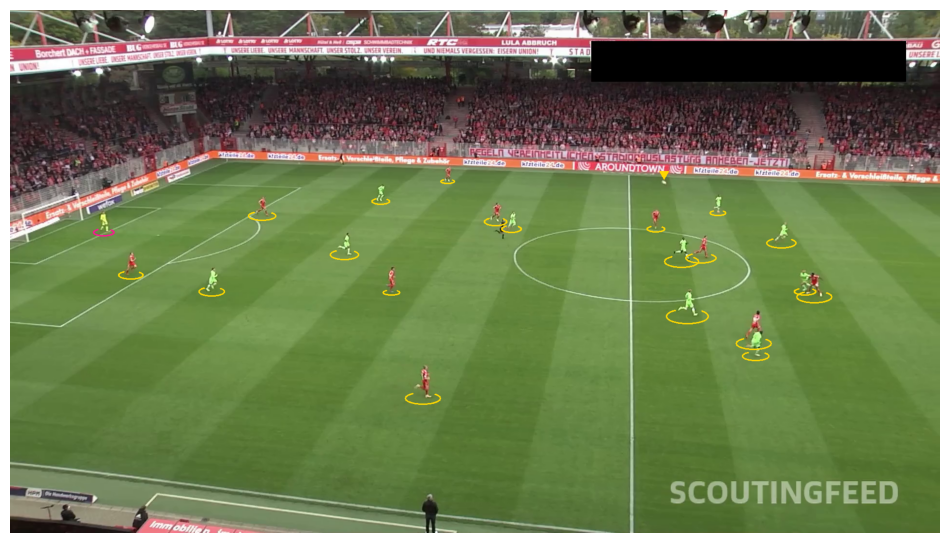

In [26]:
import supervision as sv
from src.annotators import get_annotators

# Use config constants instead of hardcoded values
# SOURCE_VIDEO_PATH already defined above

ellipse_annotator, label_annotator, triangle_annotator = get_annotators()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# Test player detection model
result = PLAYER_DETECTION_MODEL.predict(frame, conf=0.3)[0]
detections = sv.Detections.from_ultralytics(result)

print(f"Detection results using config constants:")
print(f"Ball ID: {BALL_ID}")
print(f"Goalkeeper ID: {GOALKEEPER_ID}")
print(f"Player ID: {PLAYER_ID}")
print(f"Referee ID: {REFEREE_ID}")

# Filter detections for different object types
ball_detections = detections[detections.class_id == BALL_ID]
goalkeepers_detections = detections[detections.class_id == GOALKEEPER_ID]
players_detections = detections[detections.class_id == PLAYER_ID]
referees_detections = detections[detections.class_id == REFEREE_ID]

print(f"\\nDetections found:")
print(f"Balls: {len(ball_detections)}")
print(f"Goalkeepers: {len(goalkeepers_detections)}")
print(f"Players: {len(players_detections)}")
print(f"Referees: {len(referees_detections)}")

# Annotate frame
annotated_frame = ellipse_annotator.annotate(frame.copy(), players_detections)
annotated_frame = ellipse_annotator.annotate(annotated_frame, goalkeepers_detections)
annotated_frame = triangle_annotator.annotate(annotated_frame, ball_detections)

sv.plot_image(annotated_frame)

Testing mini-map creation with config constants...
Pitch padding: 50
Pitch scale: 0.1
Ball point radius: 10
Player point radius: 10
Mini-map position: bottom_right
Mini-map scale: 0.2
✅ Mini-map created successfully!
✅ Mini-map overlay completed!
✅ Mini-map created successfully!
✅ Mini-map overlay completed!


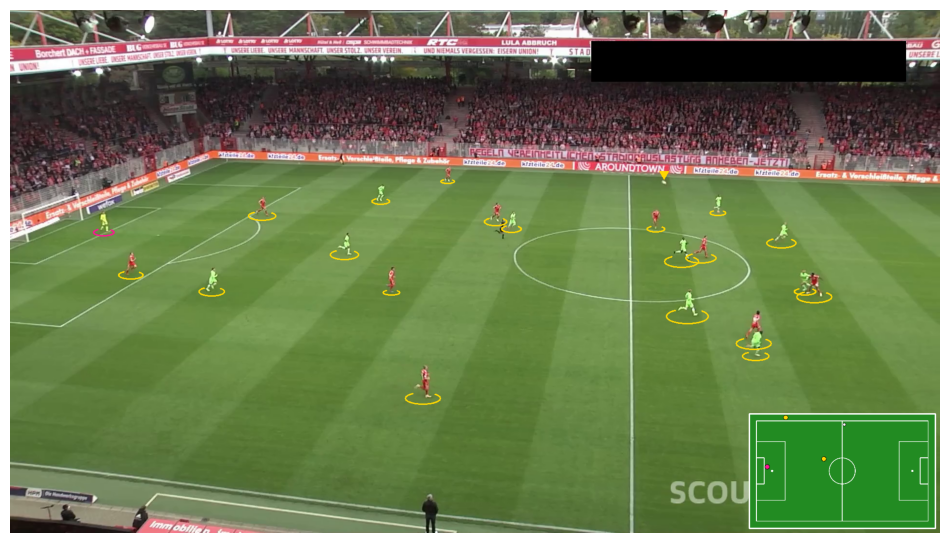

In [27]:
# Test mini-map functionality with config constants
from src.mini_map import create_mini_map, overlay_mini_map

print("Testing mini-map creation with config constants...")
print(f"Pitch padding: {PITCH_PADDING}")
print(f"Pitch scale: {PITCH_SCALE}")
print(f"Ball point radius: {BALL_POINT_RADIUS}")
print(f"Player point radius: {PLAYER_POINT_RADIUS}")
print(f"Mini-map position: {MINI_MAP_POSITION}")
print(f"Mini-map scale: {MINI_MAP_SCALE}")

# Create mini-map using config constants
mini_map_result = create_mini_map(
    frame=frame,
    ball_detections=ball_detections,
    players_detections=players_detections,
    referees_detections=referees_detections,
    goalkeepers_detections=goalkeepers_detections,
    keypoint_model=KEYPOINT_MODEL,
)

if mini_map_result is not None:
    print("✅ Mini-map created successfully!")

    # Overlay mini-map on the main frame using config constants
    main_frame_copy = annotated_frame.copy()
    overlaid_frame = overlay_mini_map(
        main_frame=main_frame_copy,
        mini_map=mini_map_result,
        # position and scale will use config defaults
    )

    print("✅ Mini-map overlay completed!")
    sv.plot_image(overlaid_frame)
else:
    print("❌ Mini-map creation failed")
    sv.plot_image(annotated_frame)

Testing complete frame processing pipeline...
✅ Frame processor initialized with config constants!
✅ Frame processor initialized with config constants!


Embedding extraction: 1it [00:06,  6.56s/it]



✅ Frame processed successfully!
Original frame shape: (1080, 1920, 3)
Processed frame shape: (1080, 1920, 3)


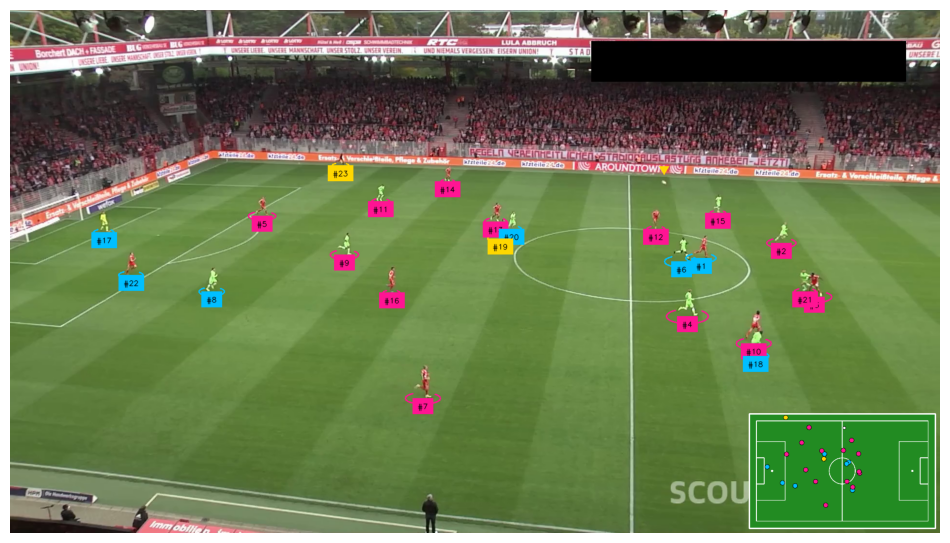

In [29]:
# Test the complete frame processing pipeline with config constants
from src.frame_processor import initialize_frame_processor, process_frame
from src.team import TeamClassifier, TeamConsistencyTracker
from src.annotators import get_tracker

print("Testing complete frame processing pipeline...")

# Initialize team classifier and tracker
team_classifier = TeamClassifier(device="cpu")
tracker = get_tracker()
tracker.reset()
team_tracker = TeamConsistencyTracker()

# Initialize the frame processor with config constants
initialize_frame_processor(
    player_detection_model=PLAYER_DETECTION_MODEL,
    keypoint_model=KEYPOINT_MODEL,
    tracker_obj=tracker,
    team_classifier_obj=team_classifier,
    team_tracker_obj=team_tracker,
    ellipse_ann=ellipse_annotator,
    label_ann=label_annotator,
    triangle_ann=triangle_annotator,
    # ball_id, goalkeeper_id, player_id, referee_id will use config defaults
)

print("✅ Frame processor initialized with config constants!")

# Process a frame (second parameter is unused)
test_frame = frame.copy()
processed_frame = process_frame(test_frame, 0)

print("✅ Frame processed successfully!")
print(f"Original frame shape: {frame.shape}")
print(f"Processed frame shape: {processed_frame.shape}")

sv.plot_image(processed_frame)

Testing configuration flexibility...
\n🔧 Changing mini-map configuration:
Testing position: top_left
✅ Successfully changed mini-map position to: top_left


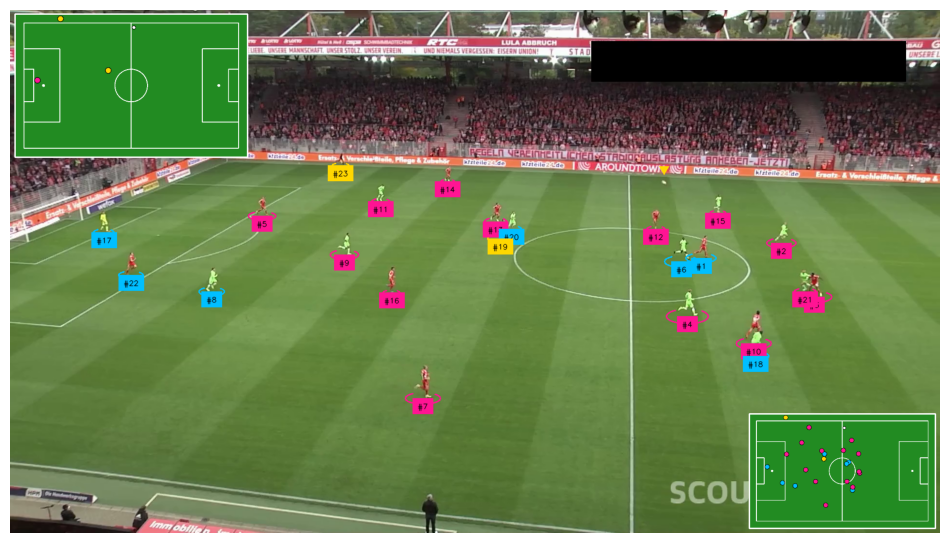

\n📊 Current configuration constants summary:
• Ball ID: 0
• Goalkeeper ID: 1
• Player ID: 2
• Referee ID: 3
• Pitch padding: 50px
• Pitch scale: 0.1
• Player point radius: 10px
• Ball point radius: 10px
• Default mini-map position: bottom_right
• Default mini-map scale: 0.2
\n🎉 All tests completed successfully!
🔧 Configuration constants are working properly!
✅ Pipeline is fully functional with the new config system!


In [30]:
# Test configuration flexibility - change mini-map position and scale
from src.mini_map import overlay_mini_map

print("Testing configuration flexibility...")
print("\\n🔧 Changing mini-map configuration:")

# Test different positions and scales
positions = ["top_left", "top_right", "bottom_left", "bottom_right"]
scales = [0.15, 0.25, 0.3]

test_frame_copy = processed_frame.copy()

# Test different positions
for i, position in enumerate(positions[:2]):  # Test first 2 positions
    print(f"Testing position: {position}")

    overlaid_test = overlay_mini_map(
        main_frame=test_frame_copy.copy(),
        mini_map=mini_map_result,
        position=position,
        scale=0.25,
    )

    # Show just one example
    if i == 0:
        print(f"✅ Successfully changed mini-map position to: {position}")
        sv.plot_image(overlaid_test)
        break

print("\\n📊 Current configuration constants summary:")
print(f"• Ball ID: {BALL_ID}")
print(f"• Goalkeeper ID: {GOALKEEPER_ID}")
print(f"• Player ID: {PLAYER_ID}")
print(f"• Referee ID: {REFEREE_ID}")
print(f"• Pitch padding: {PITCH_PADDING}px")
print(f"• Pitch scale: {PITCH_SCALE}")
print(f"• Player point radius: {PLAYER_POINT_RADIUS}px")
print(f"• Ball point radius: {BALL_POINT_RADIUS}px")
print(f"• Default mini-map position: {MINI_MAP_POSITION}")
print(f"• Default mini-map scale: {MINI_MAP_SCALE}")

print("\\n🎉 All tests completed successfully!")
print("🔧 Configuration constants are working properly!")
print("✅ Pipeline is fully functional with the new config system!")


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 2 referees, 4384.4ms
Speed: 25.9ms preprocess, 4384.4ms inference, 6.8ms postprocess per image at shape (1, 3, 736, 1280)


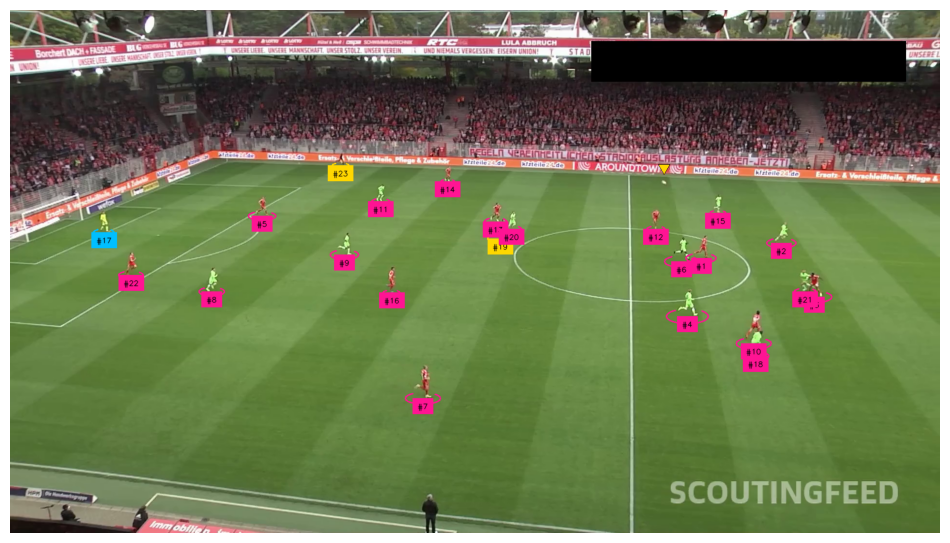

In [5]:
SOURCE_VIDEO_PATH = "/Volumes/Code/Footaball-analysis/inputs/121364_0.mp4"

BALL_ID = 0

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(["#00BFFF", "#FF1493", "#FFD700"]), thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(["#00BFFF", "#FF1493", "#FFD700"]),
    text_color=sv.Color.from_hex("#000000"),
    text_position=sv.Position.BOTTOM_CENTER,
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex("#FFD700"), base=25, height=21, outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = model.predict(frame, conf=0.3)[0]
detections = sv.Detections.from_ultralytics(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections.class_id -= 1
all_detections = tracker.update_with_detections(detections=all_detections)

labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame, detections=all_detections
)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame, detections=all_detections, labels=labels
)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame, detections=ball_detections
)

sv.plot_image(annotated_frame)

In [6]:
from tqdm import tqdm

PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE
)

crops = []
for frame in tqdm(frame_generator, desc="collecting crops"):
    result = model.predict(frame, conf=0.3)[0]
    detections = sv.Detections.from_ultralytics(result)
    detections = detections.with_nms(threshold=0.5, class_agnostic=True)
    detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

collecting crops: 0it [00:00, ?it/s]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 2 referees, 4508.4ms
Speed: 30.3ms preprocess, 4508.4ms inference, 6.2ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 1it [00:04,  4.67s/it]


0: 736x1280 1 goalkeeper, 20 players, 2 referees, 4098.3ms
Speed: 20.0ms preprocess, 4098.3ms inference, 5.6ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 2it [00:08,  4.44s/it]


0: 736x1280 1 goalkeeper, 20 players, 2 referees, 3883.3ms
Speed: 13.1ms preprocess, 3883.3ms inference, 6.8ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 3it [00:12,  4.25s/it]


0: 736x1280 20 players, 2 referees, 3699.2ms
Speed: 14.8ms preprocess, 3699.2ms inference, 5.5ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 4it [00:16,  4.08s/it]


0: 736x1280 20 players, 2 referees, 4051.8ms
Speed: 21.1ms preprocess, 4051.8ms inference, 7.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 5it [00:20,  4.12s/it]


0: 736x1280 1 ball, 20 players, 2 referees, 3770.7ms
Speed: 20.2ms preprocess, 3770.7ms inference, 5.9ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 6it [00:24,  4.04s/it]


0: 736x1280 20 players, 2 referees, 3801.3ms
Speed: 14.4ms preprocess, 3801.3ms inference, 6.6ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 7it [00:28,  4.01s/it]


0: 736x1280 1 ball, 19 players, 2 referees, 3783.7ms
Speed: 10.8ms preprocess, 3783.7ms inference, 6.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 8it [00:32,  3.97s/it]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 2 referees, 3979.6ms
Speed: 17.3ms preprocess, 3979.6ms inference, 5.8ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 9it [00:36,  4.02s/it]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 2 referees, 3915.3ms
Speed: 17.0ms preprocess, 3915.3ms inference, 5.8ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 10it [00:40,  4.03s/it]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 2 referees, 3778.3ms
Speed: 14.3ms preprocess, 3778.3ms inference, 6.8ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 11it [00:44,  4.00s/it]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 2 referees, 3754.6ms
Speed: 23.7ms preprocess, 3754.6ms inference, 7.5ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 12it [00:48,  3.97s/it]


0: 736x1280 1 goalkeeper, 20 players, 2 referees, 3704.5ms
Speed: 25.3ms preprocess, 3704.5ms inference, 6.2ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 13it [00:52,  3.93s/it]


0: 736x1280 1 ball, 1 goalkeeper, 19 players, 2 referees, 4599.0ms
Speed: 13.8ms preprocess, 4599.0ms inference, 6.8ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 14it [00:57,  4.17s/it]


0: 736x1280 1 goalkeeper, 20 players, 2 referees, 4143.0ms
Speed: 14.5ms preprocess, 4143.0ms inference, 4.7ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 15it [01:01,  4.21s/it]


0: 736x1280 1 goalkeeper, 20 players, 2 referees, 3859.9ms
Speed: 16.4ms preprocess, 3859.9ms inference, 8.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 16it [01:05,  4.15s/it]


0: 736x1280 1 goalkeeper, 20 players, 2 referees, 3991.1ms
Speed: 24.1ms preprocess, 3991.1ms inference, 6.5ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 17it [01:09,  4.15s/it]


0: 736x1280 1 goalkeeper, 21 players, 2 referees, 4253.8ms
Speed: 11.6ms preprocess, 4253.8ms inference, 6.4ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 18it [01:14,  4.23s/it]


0: 736x1280 1 goalkeeper, 20 players, 2 referees, 5377.7ms
Speed: 28.2ms preprocess, 5377.7ms inference, 6.9ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 19it [01:19,  4.63s/it]


0: 736x1280 1 goalkeeper, 20 players, 2 referees, 3978.0ms
Speed: 15.8ms preprocess, 3978.0ms inference, 8.3ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 20it [01:23,  4.48s/it]


0: 736x1280 1 goalkeeper, 20 players, 2 referees, 4348.2ms
Speed: 11.5ms preprocess, 4348.2ms inference, 17.3ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 21it [01:28,  4.50s/it]


0: 736x1280 1 goalkeeper, 20 players, 2 referees, 4494.9ms
Speed: 25.6ms preprocess, 4494.9ms inference, 6.3ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 22it [01:33,  4.55s/it]


0: 736x1280 1 ball, 1 goalkeeper, 19 players, 2 referees, 3941.1ms
Speed: 14.1ms preprocess, 3941.1ms inference, 5.5ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 23it [01:37,  4.41s/it]


0: 736x1280 1 goalkeeper, 21 players, 2 referees, 3798.1ms
Speed: 14.4ms preprocess, 3798.1ms inference, 5.7ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 24it [01:41,  4.27s/it]


0: 736x1280 1 goalkeeper, 20 players, 2 referees, 3890.9ms
Speed: 16.3ms preprocess, 3890.9ms inference, 6.6ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 25it [01:45,  4.21s/it]


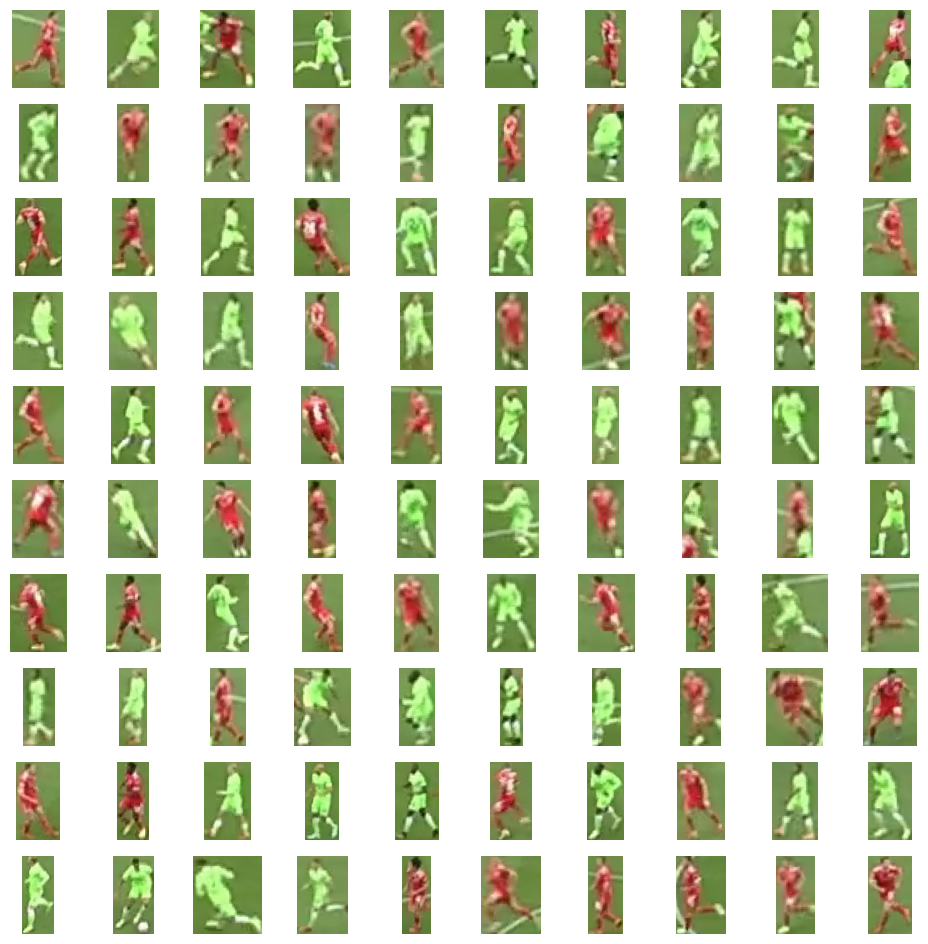

In [7]:
sv.plot_images_grid(crops[:100], grid_size=(10, 10))

In [8]:
import torch
from transformers import AutoProcessor, SiglipVisionModel

SIGLIP_MODEL_PATH = "google/siglip-base-patch16-224"

DEVICE = "cpu"
EMBEDDINGS_MODEL = SiglipVisionModel.from_pretrained(SIGLIP_MODEL_PATH).to(DEVICE)
EMBEDDINGS_PROCESSOR = AutoProcessor.from_pretrained(SIGLIP_MODEL_PATH)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [9]:
import torch

print("torch version:", torch.__version__)
print("cuda available:", torch.cuda.is_available())

torch version: 2.2.2
cuda available: False


In [10]:
import numpy as np
from more_itertools import chunked

BATCH_SIZE = 32

crops = [sv.cv2_to_pillow(crop) for crop in crops]
batches = chunked(crops, BATCH_SIZE)
data = []
with torch.no_grad():
    for batch in tqdm(batches, desc="embedding extraction"):
        inputs = EMBEDDINGS_PROCESSOR(images=batch, return_tensors="pt").to(DEVICE)
        outputs = EMBEDDINGS_MODEL(**inputs)
        embeddings = torch.mean(outputs.last_hidden_state, dim=1).cpu().numpy()
        data.append(embeddings)

data = np.concatenate(data)

embedding extraction: 16it [01:47,  6.69s/it]


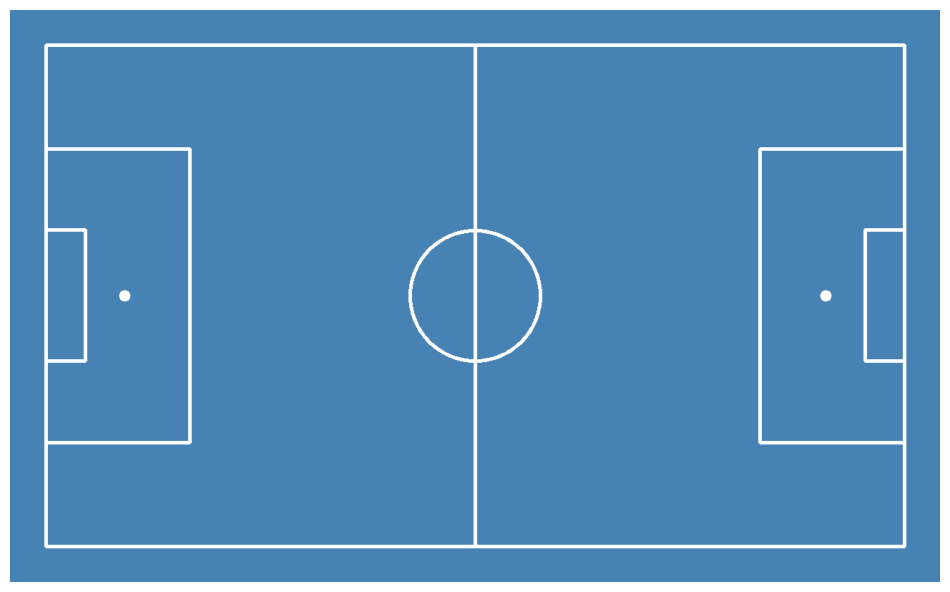

In [2]:
import sys

sys.path.append("/Volumes/Code/Footaball-analysis")

from src.soccer_pitch import SoccerPitchConfiguration
from src.soccer import draw_pitch
import supervision as sv

CONFIG = SoccerPitchConfiguration()

annotated_frame = draw_pitch(
    CONFIG,
    background_color=sv.Color(70, 130, 180),  # SteelBlue
    line_color=sv.Color.WHITE,
)

sv.plot_image(annotated_frame)


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 2 referees, 5453.6ms
Speed: 43.4ms preprocess, 5453.6ms inference, 5.5ms postprocess per image at shape (1, 3, 736, 1280)
0: 736x1280 1 ball, 1 goalkeeper, 20 players, 2 referees, 5453.6ms
Speed: 43.4ms preprocess, 5453.6ms inference, 5.5ms postprocess per image at shape (1, 3, 736, 1280)


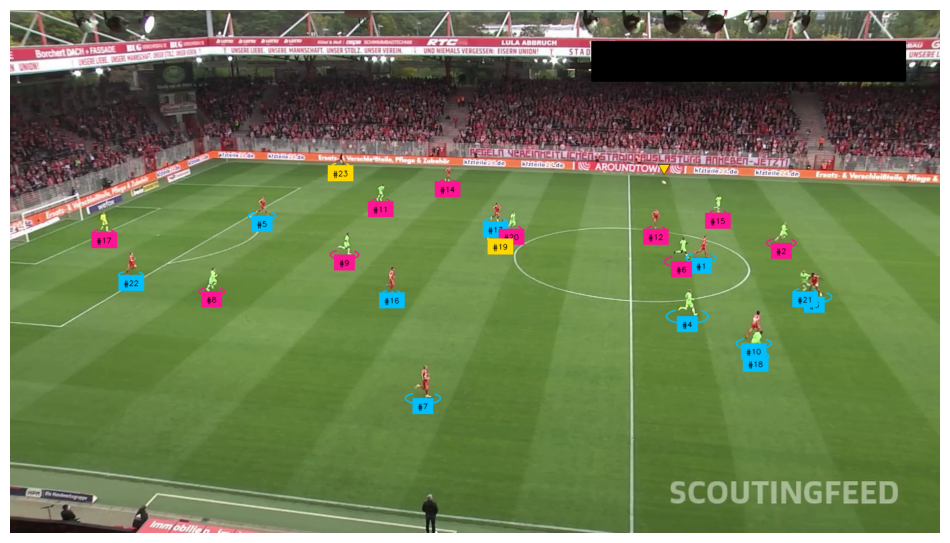

In [7]:
import supervision as sv
import numpy as np
from src.model import get_models
from src.config import resolve_goalkeepers_team_id
from src.team import TeamClassifier

PLAYER_DETECTION_MODEL, KEYPOINT_MODEL = get_models(
    player_detection_model_path="/Volumes/Code/Footaball-analysis/models/player-detection.pt",
    keypoint_model_path="/Volumes/Code/Footaball-analysis/models/keypoint-detection.pt",
)

SOURCE_VIDEO_PATH = "/Volumes/Code/Footaball-analysis/inputs/121364_0.mp4"

BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(["#00BFFF", "#FF1493", "#FFD700"]), thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(["#00BFFF", "#FF1493", "#FFD700"]),
    text_color=sv.Color.from_hex("#000000"),
    text_position=sv.Position.BOTTOM_CENTER,
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex("#FFD700"), base=25, height=21, outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.predict(frame, conf=0.3)[0]
detections = sv.Detections.from_ultralytics(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

# For now, assign random team IDs to players instead of using the classifier
# This is because the TeamClassifier needs to be fitted first with training data
if len(players_detections) > 0:
    players_detections.class_id = np.random.choice([0, 1], size=len(players_detections))

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections
)

# Set referee class_id to 2 (different from team 0 and 1)
if len(referees_detections) > 0:
    referees_detections.class_id = np.full(len(referees_detections), 2)

all_detections = sv.Detections.merge(
    [players_detections, goalkeepers_detections, referees_detections]
)

labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame, detections=all_detections
)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame, detections=all_detections, labels=labels
)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame, detections=ball_detections
)

sv.plot_image(annotated_frame)


0: 384x640 1 pitch, 1818.7ms
Speed: 5.4ms preprocess, 1818.7ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 1 pitch, 1818.7ms
Speed: 5.4ms preprocess, 1818.7ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)


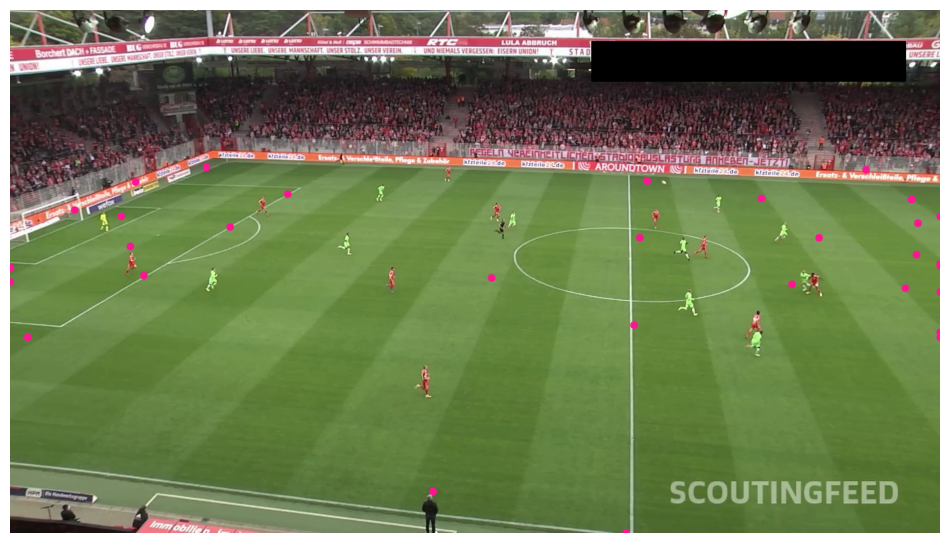

In [9]:
import supervision as sv

SOURCE_VIDEO_PATH = "/Volumes/Code/Footaball-analysis/inputs/121364_0.mp4"


vertex_annotator = sv.VertexAnnotator(color=sv.Color.from_hex("#FF1493"), radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = KEYPOINT_MODEL.predict(frame, conf=0.3)[0]
key_points = sv.KeyPoints.from_ultralytics(result)

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame, key_points=key_points
)

sv.plot_image(annotated_frame)


0: 384x640 1 pitch, 2989.9ms
Speed: 16.3ms preprocess, 2989.9ms inference, 7.7ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 1 pitch, 2989.9ms
Speed: 16.3ms preprocess, 2989.9ms inference, 7.7ms postprocess per image at shape (1, 3, 384, 640)


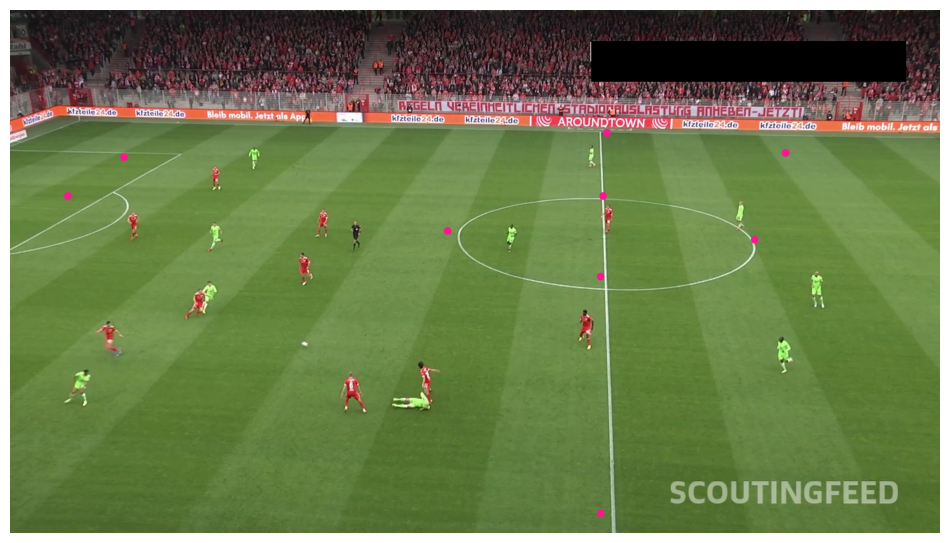

In [10]:
import supervision as sv


vertex_annotator = sv.VertexAnnotator(color=sv.Color.from_hex("#FF1493"), radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = KEYPOINT_MODEL.predict(frame, conf=0.3)[0]
key_points = sv.KeyPoints.from_ultralytics(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(xy=frame_reference_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame, key_points=frame_reference_key_points
)

sv.plot_image(annotated_frame)


0: 384x640 1 pitch, 3561.1ms
Speed: 38.8ms preprocess, 3561.1ms inference, 9.6ms postprocess per image at shape (1, 3, 384, 640)
0: 384x640 1 pitch, 3561.1ms
Speed: 38.8ms preprocess, 3561.1ms inference, 9.6ms postprocess per image at shape (1, 3, 384, 640)


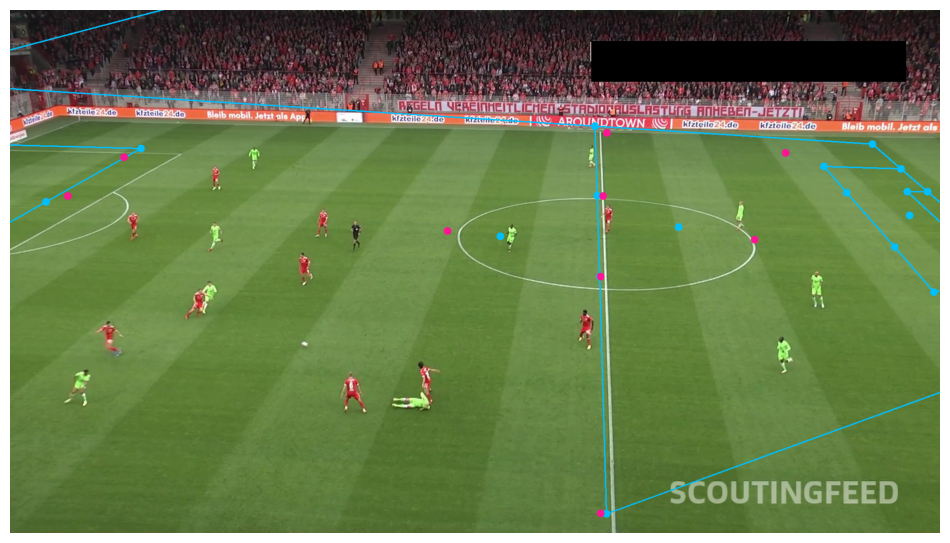

In [12]:
import numpy as np
import supervision as sv
from src.view import ViewTransformer

SOURCE_VIDEO_PATH = "/Volumes/Code/Footaball-analysis/inputs/121364_0.mp4"

edge_annotator = sv.EdgeAnnotator(
    color=sv.Color.from_hex("#00BFFF"), thickness=2, edges=CONFIG.edges
)
vertex_annotator = sv.VertexAnnotator(color=sv.Color.from_hex("#FF1493"), radius=8)
vertex_annotator_2 = sv.VertexAnnotator(color=sv.Color.from_hex("#00BFFF"), radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = KEYPOINT_MODEL.predict(frame, conf=0.3)[0]
key_points = sv.KeyPoints.from_ultralytics(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(xy=frame_reference_points[np.newaxis, ...])

pitch_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=pitch_reference_points, target=frame_reference_points
)

pitch_all_points = np.array(CONFIG.vertices)
frame_all_points = transformer.transform_points(points=pitch_all_points)

frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = edge_annotator.annotate(
    scene=annotated_frame, key_points=frame_all_key_points
)
annotated_frame = vertex_annotator_2.annotate(
    scene=annotated_frame, key_points=frame_all_key_points
)
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame, key_points=frame_reference_key_points
)

sv.plot_image(annotated_frame)

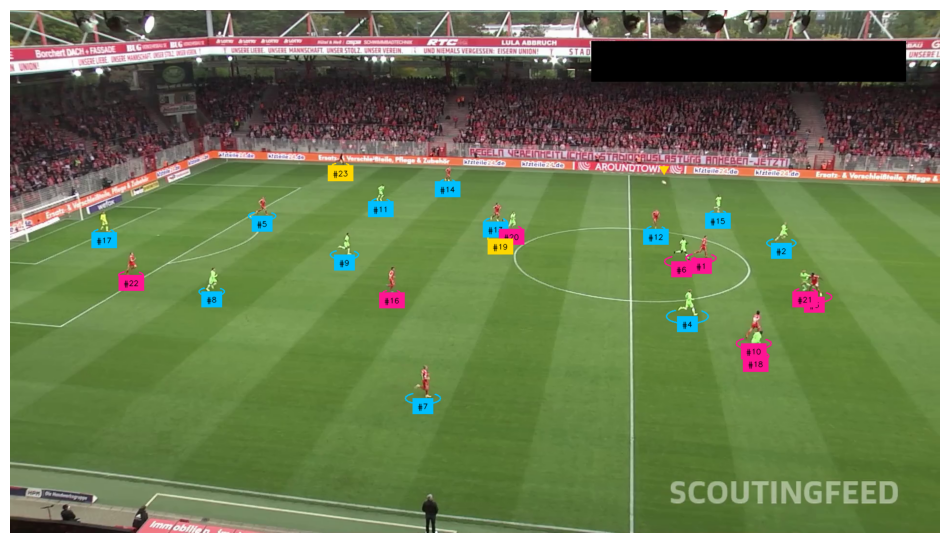

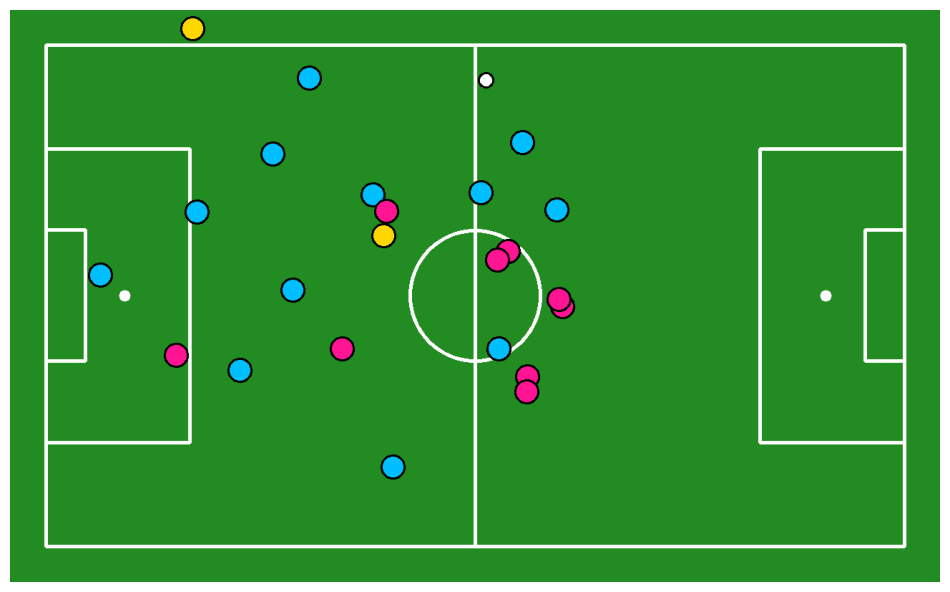

In [14]:
from src.soccer import draw_pitch, draw_points_on_pitch
from src.config import resolve_goalkeepers_team_id
from src.team import TeamClassifier
from src.view import ViewTransformer
import supervision as sv
import numpy as np

PLAYER_DETECTION_MODEL, KEYPOINT_MODEL = get_models(
    player_detection_model_path="/Volumes/Code/Footaball-analysis/models/player-detection.pt",
    keypoint_model_path="/Volumes/Code/Footaball-analysis/models/keypoint-detection.pt",
)

team_classifier = TeamClassifier()
# Normally, you would fit the classifier with training data here
SOURCE_VIDEO_PATH = "/Volumes/Code/Footaball-analysis/inputs/121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(["#00BFFF", "#FF1493", "#FFD700"]), thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(["#00BFFF", "#FF1493", "#FFD700"]),
    text_color=sv.Color.from_hex("#000000"),
    text_position=sv.Position.BOTTOM_CENTER,
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex("#FFD700"), base=20, height=17
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# ball, goalkeeper, player, referee detection

result = PLAYER_DETECTION_MODEL.predict(frame, conf=0.3, verbose=False)[0]
detections = sv.Detections.from_ultralytics(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

# team assignment - using random assignment since classifier needs fitting
if len(players_detections) > 0:
    players_detections.class_id = np.random.choice([0, 1], size=len(players_detections))

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections
)

if len(referees_detections) > 0:
    referees_detections.class_id = np.full(len(referees_detections), 2)

all_detections = sv.Detections.merge(
    [players_detections, goalkeepers_detections, referees_detections]
)

# frame visualization

labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame, detections=all_detections
)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame, detections=all_detections, labels=labels
)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame, detections=ball_detections
)

sv.plot_image(annotated_frame)

players_detections = sv.Detections.merge([players_detections, goalkeepers_detections])

# detect pitch key points

result = KEYPOINT_MODEL.predict(frame, conf=0.3, verbose=False)[0]
key_points = sv.KeyPoints.from_ultralytics(result)

# project ball, players and referies on pitch

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
pitch_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=frame_reference_points, target=pitch_reference_points
)

frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_players_xy = transformer.transform_points(points=players_xy)

referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_referees_xy = transformer.transform_points(points=referees_xy)

# visualize video game-style radar view

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_ball_xy,
    face_color=sv.Color.WHITE,
    edge_color=sv.Color.BLACK,
    radius=10,
    pitch=annotated_frame,
)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 0],
    face_color=sv.Color.from_hex("00BFFF"),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame,
)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 1],
    face_color=sv.Color.from_hex("FF1493"),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame,
)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_referees_xy,
    face_color=sv.Color.from_hex("FFD700"),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame,
)

sv.plot_image(annotated_frame)

Testing mini_map module...
Ball detections: 1
Player detections: 21
Goalkeeper detections: 1
Referee detections: 2
Frame shape: (1080, 1920, 3)
✅ Mini map created successfully!
Mini map shape: (800, 1300, 3)
✅ Mini map created successfully!
Mini map shape: (800, 1300, 3)


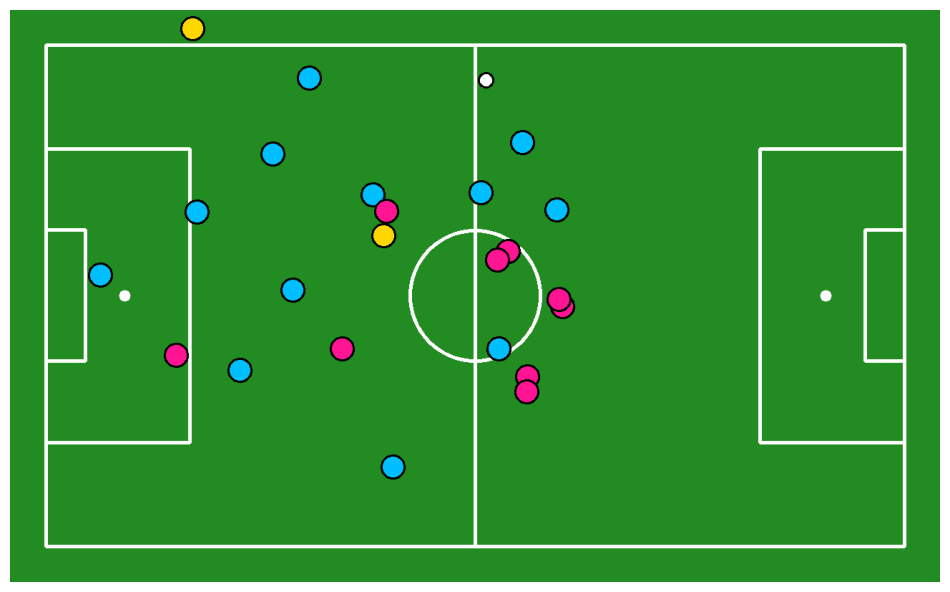

Mini_map module test completed!


In [15]:
# Test mini_map module
import sys

sys.path.append("/Volumes/Code/Footaball-analysis")

from src.mini_map import create_mini_map
import supervision as sv
import numpy as np

print("Testing mini_map module...")

# Use existing variables from previous cells
print(f"Ball detections: {len(ball_detections)}")
print(f"Player detections: {len(players_detections)}")
print(f"Goalkeeper detections: {len(goalkeepers_detections)}")
print(f"Referee detections: {len(referees_detections)}")
print(f"Frame shape: {frame.shape}")

# Test the mini_map creation
mini_map_result = create_mini_map(
    frame=frame,
    ball_detections=ball_detections,
    players_detections=players_detections,
    referees_detections=referees_detections,
    goalkeepers_detections=goalkeepers_detections,
    keypoint_model=KEYPOINT_MODEL,
)

if mini_map_result is not None:
    print("✅ Mini map created successfully!")
    print(f"Mini map shape: {mini_map_result.shape}")
    sv.plot_image(mini_map_result)
else:
    print("❌ Mini map creation failed - not enough keypoints detected")

print("Mini_map module test completed!")

Testing overlay_mini_map functionality...
Testing different scales in bottom_right position:
Scale 0.15: Frame shape (1080, 1920, 3)
Scale 0.2: Frame shape (1080, 1920, 3)


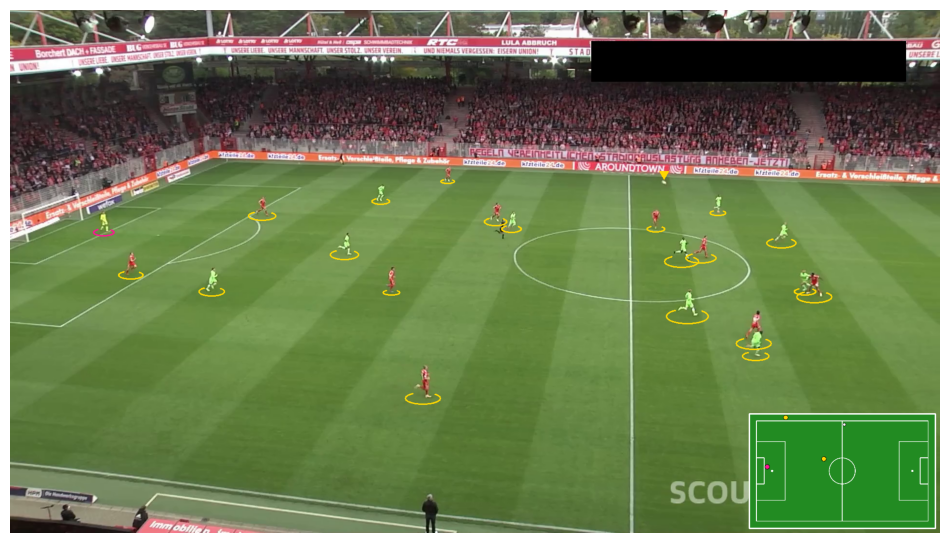

Scale 0.25: Frame shape (1080, 1920, 3)

Testing different positions with scale 0.2:
Position bottom_right: ✅ Success


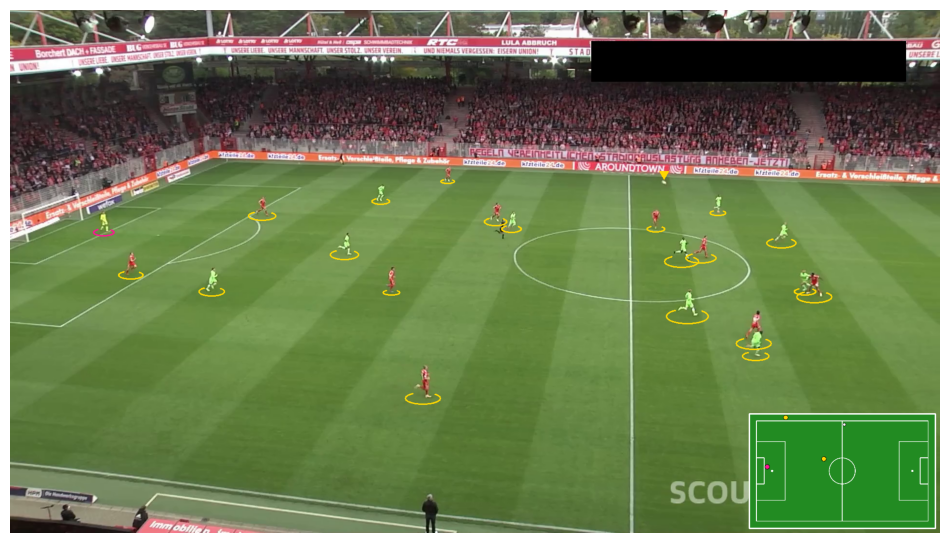

Position bottom_left: ✅ Success


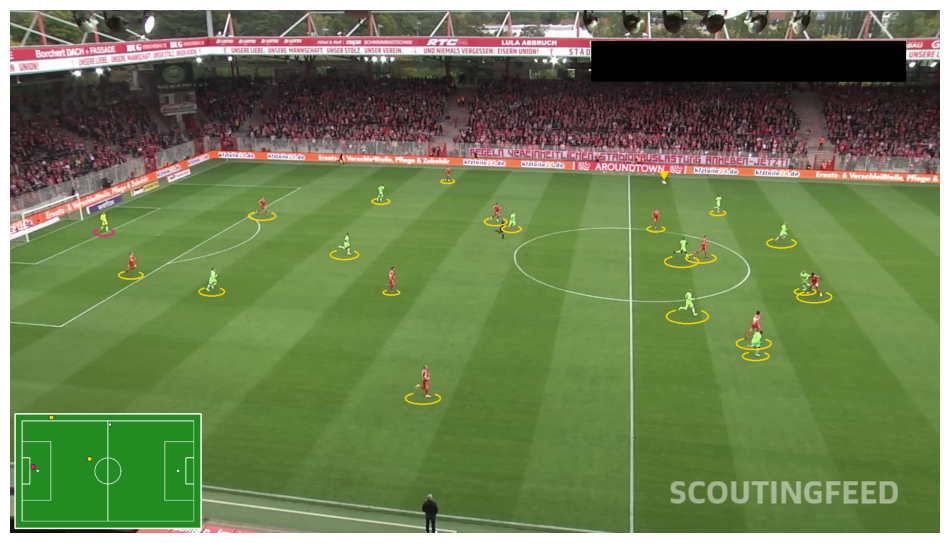

Position top_right: ✅ Success


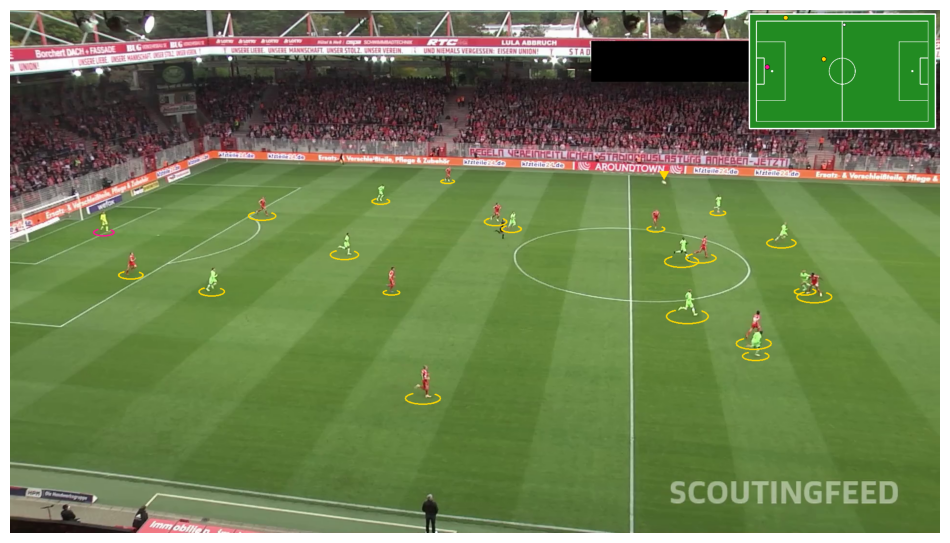

Position top_left: ✅ Success


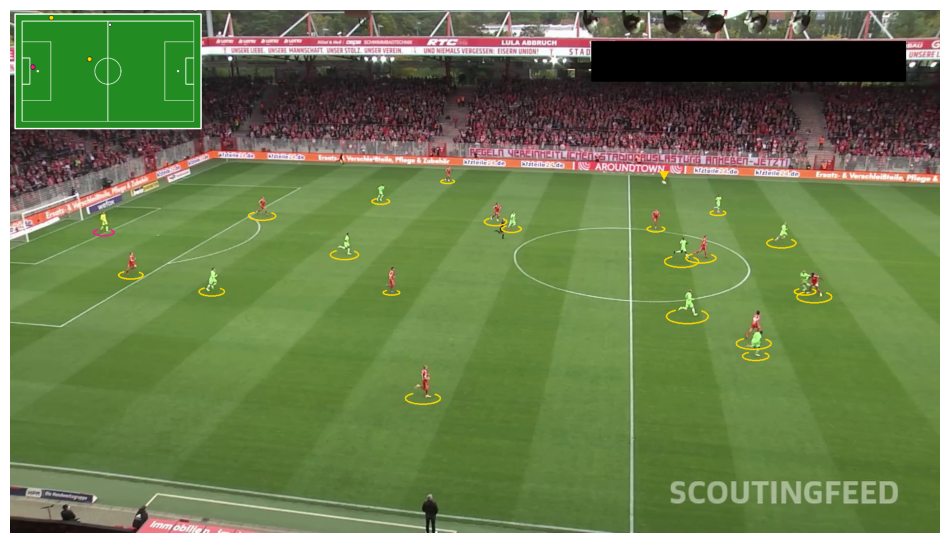

✅ Overlay functionality test completed successfully!


In [34]:
# Test the overlay_mini_map functionality
import importlib
import src.mini_map

importlib.reload(src.mini_map)

from src.mini_map import overlay_mini_map
import supervision as sv

print("Testing overlay_mini_map functionality...")

# Use the annotated frame from the detection and the mini_map_result
# Create a copy so we don't modify the original
main_frame_copy = annotated_frame.copy()

# Test different positions
positions = ["bottom_right", "bottom_left", "top_right", "top_left"]
scales = [0.15, 0.2, 0.25]

# Test bottom_right position with different scales
print("Testing different scales in bottom_right position:")
for i, scale in enumerate(scales):
    test_frame = annotated_frame.copy()
    overlaid_frame = overlay_mini_map(
        test_frame, mini_map_result, "bottom_right", scale
    )
    print(f"Scale {scale}: Frame shape {overlaid_frame.shape}")
    if i == 1:  # Show the middle scale
        sv.plot_image(overlaid_frame)

# Test different positions with optimal scale
print("\nTesting different positions with scale 0.2:")
for i, position in enumerate(positions):
    test_frame = annotated_frame.copy()
    overlaid_frame = overlay_mini_map(test_frame, mini_map_result, position, 0.2)
    print(f"Position {position}: ✅ Success")  # Show one example
    sv.plot_image(overlaid_frame)

print("✅ Overlay functionality test completed successfully!")

Testing frame_processor module...
✅ Frame processor initialized successfully!
Processing frame...


Embedding extraction: 1it [00:06,  6.12s/it]


✅ Frame processed successfully!
Input frame shape: (1080, 1920, 3)
Output frame shape: (1080, 1920, 3)


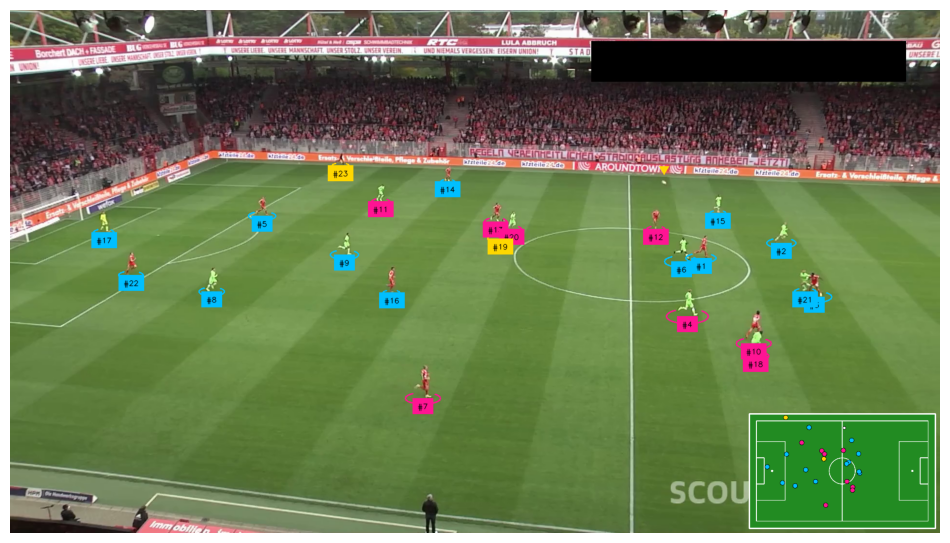

✅ Frame processor module test completed!


In [36]:
# Test the frame_processor module
import sys

sys.path.append("/Volumes/Code/Footaball-analysis")

# Reload the module to get the latest changes
import importlib
import src.frame_processor

importlib.reload(src.frame_processor)

from src.frame_processor import initialize_frame_processor, process_frame
import supervision as sv

from src.team import TeamConsistencyTracker

print("Testing frame_processor module...")

# Create a proper TeamConsistencyTracker instance
team_tracker_instance = TeamConsistencyTracker()

# Initialize the frame processor with existing variables
initialize_frame_processor(
    player_detection_model=PLAYER_DETECTION_MODEL,
    keypoint_model=KEYPOINT_MODEL,
    tracker_obj=tracker,
    team_classifier_obj=team_classifier,
    team_tracker_obj=team_tracker_instance,
    ellipse_ann=ellipse_annotator,
    label_ann=label_annotator,
    triangle_ann=triangle_annotator,
    ball_id=BALL_ID,
    goalkeeper_id=GOALKEEPER_ID,
    player_id=PLAYER_ID,
    referee_id=REFEREE_ID,
)

print("✅ Frame processor initialized successfully!")

# Test processing a frame
print("Processing frame...")
processed_frame = process_frame(frame, None)

print(f"✅ Frame processed successfully!")
print(f"Input frame shape: {frame.shape}")
print(f"Output frame shape: {processed_frame.shape}")

# Display the processed frame
sv.plot_image(processed_frame)

print("✅ Frame processor module test completed!")